In [2]:
import os
import librosa
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Conv2D,MaxPool2D,Flatten,Dense,Dropout
from tensorflow.keras.optimizers import Adam

## Visualizing Single Audio

**for moore info about librosa library, go to librosa.org

In [2]:
random_file_name = './jazz.00001.wav'

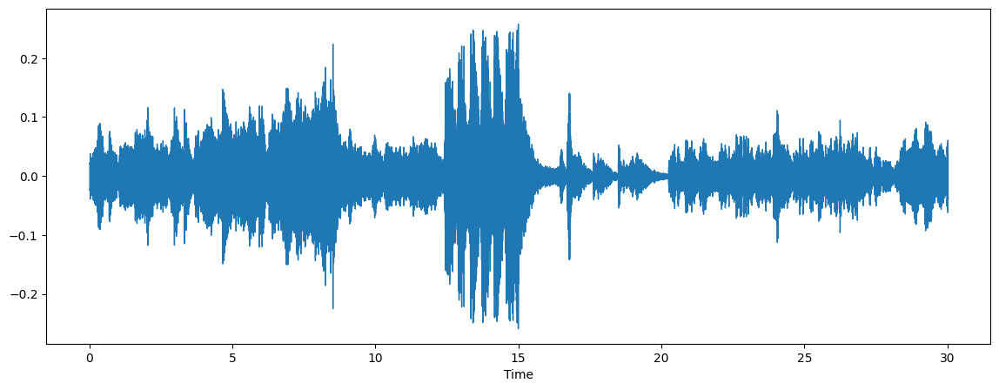

In [3]:
y,sr = librosa.load(random_file_name, sr = 44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y,sr=sr)


In [4]:
y

array([0.00239175, 0.00399411, 0.00551207, ..., 0.00188223, 0.00119216,
       0.00050476], dtype=float32)

In [5]:
sr

44100

In [6]:
y.shape

(1323588,)

## Playing Sound

In [7]:
from IPython.display import Audio
Audio(data=y, rate=sr)

In [8]:
random_file_name1 = './blues.00000.wav'

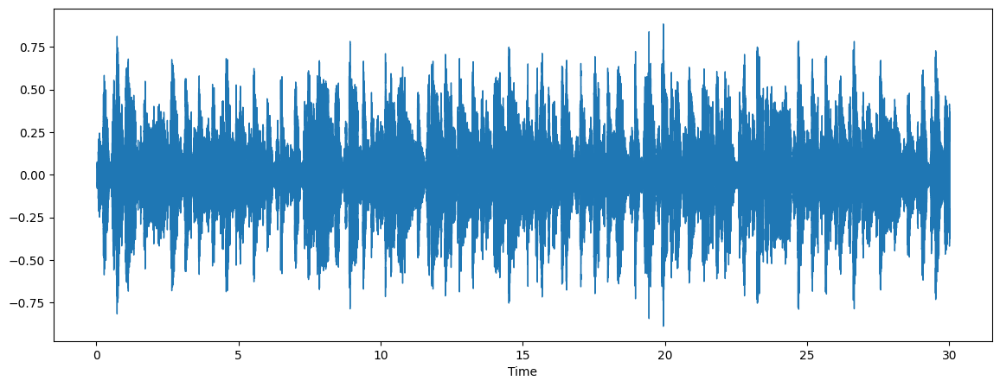

In [9]:
y,sr = librosa.load(random_file_name1, sr = 44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y,sr=sr)

In [10]:
from IPython.display import Audio
Audio(data=y, rate=sr)

## Visualization on chunks of audio

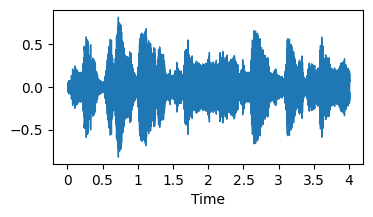

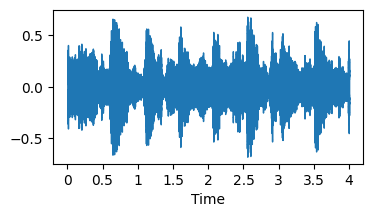

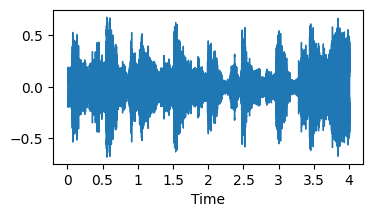

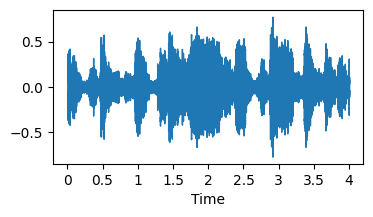

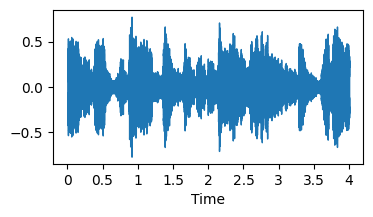

...

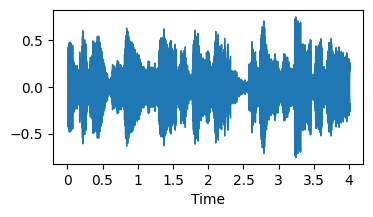

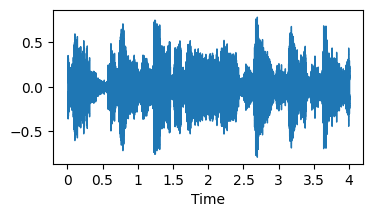

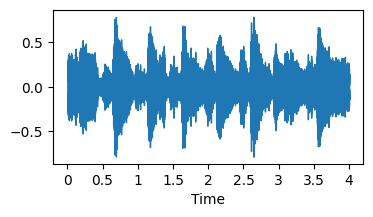

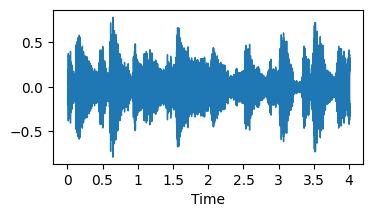

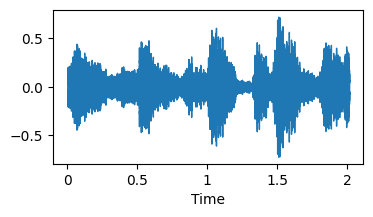

In [11]:
audio_path = './blues.00000.wav'
y,sr = librosa.load(audio_path, sr = None)  #srs=None to keep original sampling rate

#define the duration of each chunk and overlap
chunk_duration = 4
overlap_duration = 2

#convert duration to sample
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr

#Calculate the number of chunks
num_chunks = int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1

#iterate over each chunks
for i in range(num_chunks):
    #Calculate start and end indices of the chunk
    start = i*(chunk_samples-overlap_samples)
    end = start+chunk_samples
    #Extract the chunk audio
    chunk = y[start:end]
    plt.figure(figsize=(4,2))
    librosa.display.waveshow(chunk,sr=sr)
    plt.show()

## Melspectrogram Visualization

In [12]:
#Plotting Melspectrogram of Entire Audio
def plot_melspectrogram(y,sr):
    #Compute spectrogram
    spectrogram = librosa.feature.melspectrogram(y=y,sr=sr)
    #Convert to decibels (log scale)
    spectrogram_db = librosa.power_to_db(spectrogram,ref=np.max)
    #Visualize the spectrogram
    plt.figure(figsize=(10,4))
    librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
    plt.colorbar(format='%2.0f dB')
    plt.title('Spectrogram')
    plt.tight_layout()
    plt.show()

In [13]:
random_file_name1 = './blues.00000.wav'
y,sr = librosa.load(random_file_name1, sr = 44100)

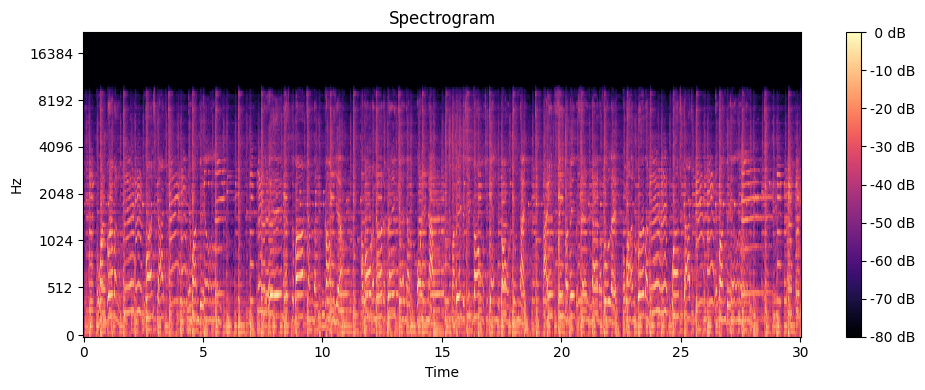

In [14]:
plot_melspectrogram(y,sr)

In [2]:
def plot_melspectrogram_chunks(y,sr):
    #define the duration of each chunk and overlap
    chunk_duration = 4
    overlap_duration = 2
    
    #convert duration to sample
    chunk_samples = chunk_duration * sr
    overlap_samples = overlap_duration * sr
    
    #Calculate the number of chunks
    num_chunks = int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1
    
    #iterate over each chunks
    for i in range(num_chunks):
        #Calculate start and end indices of the chunk
        start = i*(chunk_samples-overlap_samples)
        end = start+chunk_samples
        #Extract the chunk audio
        chunk = y[start:end]

        #Melspectrogram part
        spectrogram = librosa.feature.melspectrogram(y=chunk,sr=sr)
        print(spectrogram.shape)
        spectrogram_db = librosa.power_to_db(spectrogram,ref=np.max)
        
        #Visualize the Melsspectrogram
        plt.figure(figsize=(10,4))
        librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
        plt.colorbar(format='%2.0f dB')
        plt.title('Spectrogram')
        plt.tight_layout()
        plt.show()
        

In [3]:
random_file_name1 = './blues.00000.wav'
y,sr = librosa.load(random_file_name1, sr = 44100)

(128, 345)


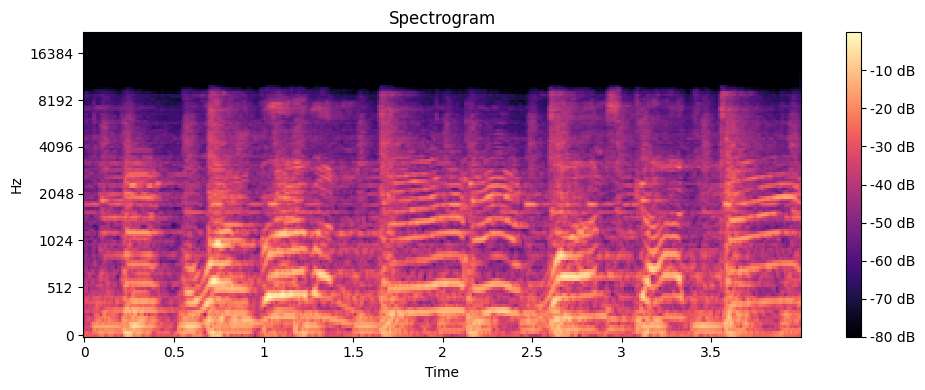

(128, 345)


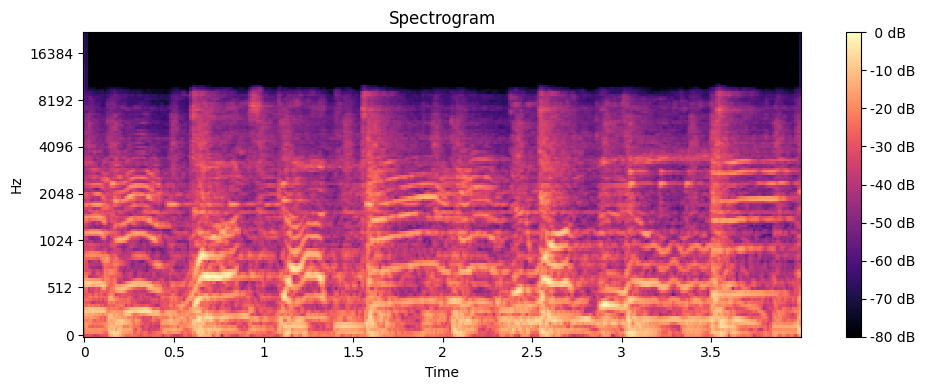

(128, 345)


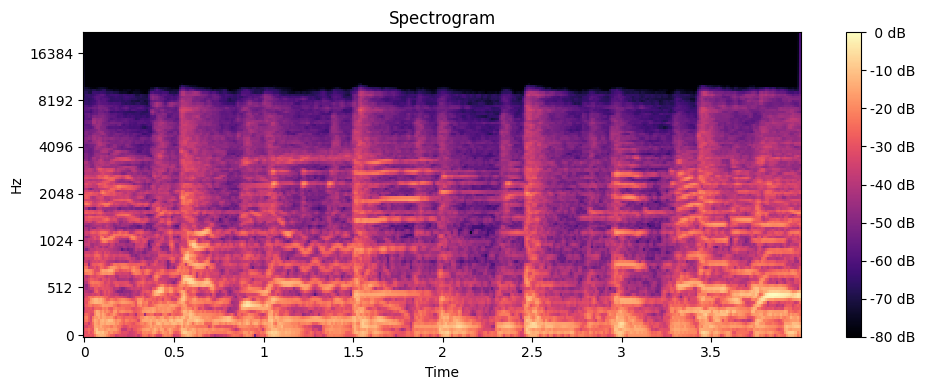

(128, 345)


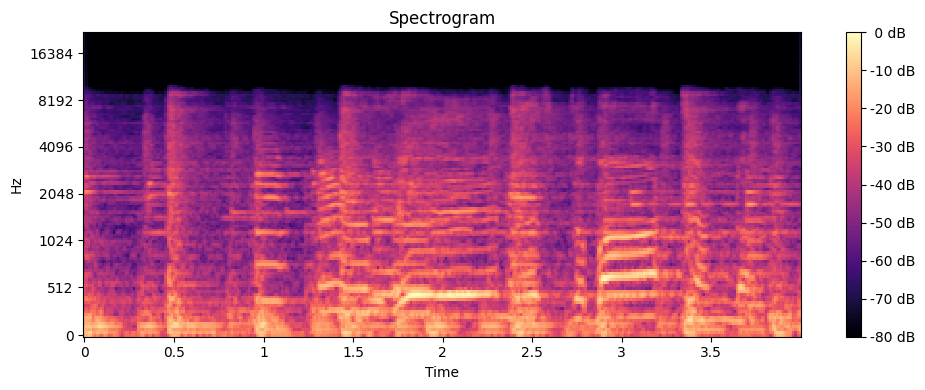

(128, 345)


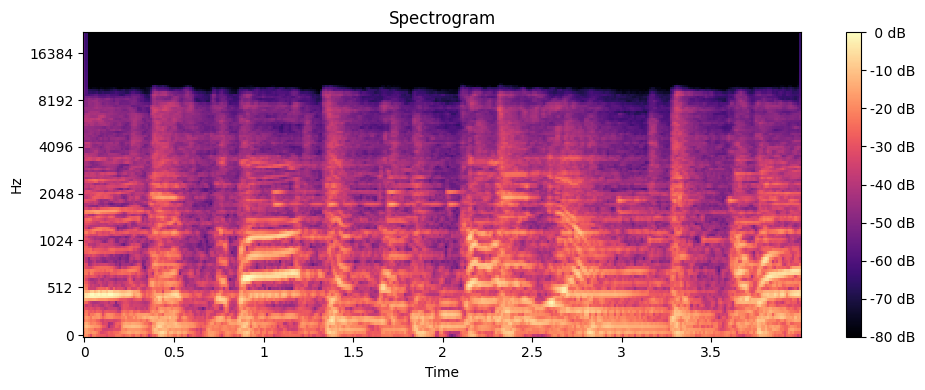

(128, 345)


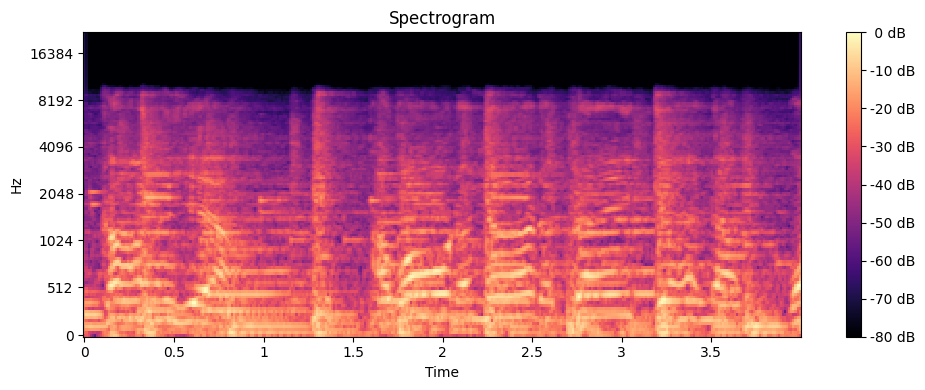

(128, 345)


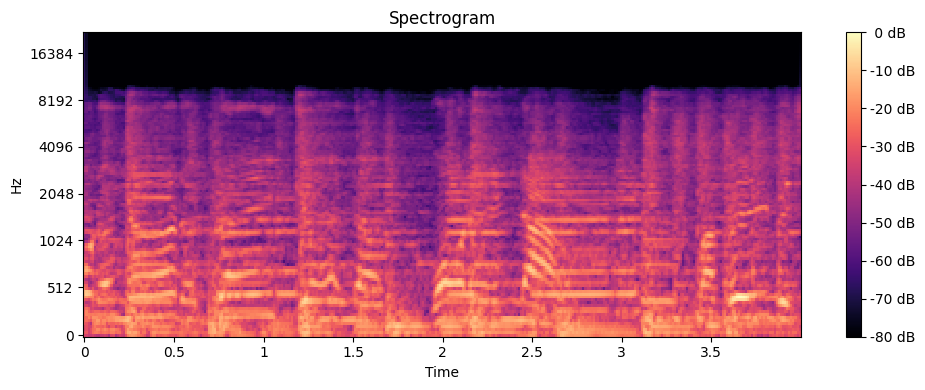

(128, 345)


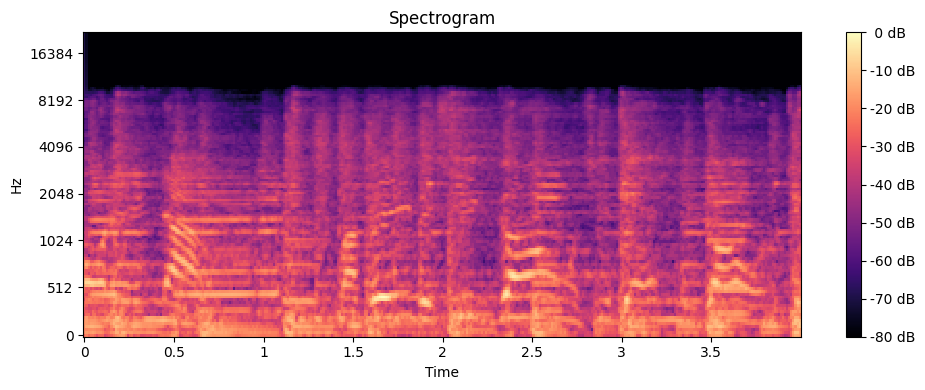

(128, 345)


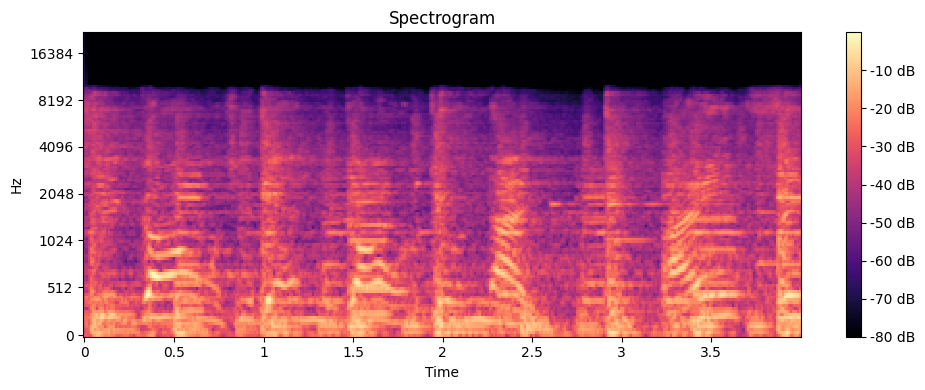

(128, 345)


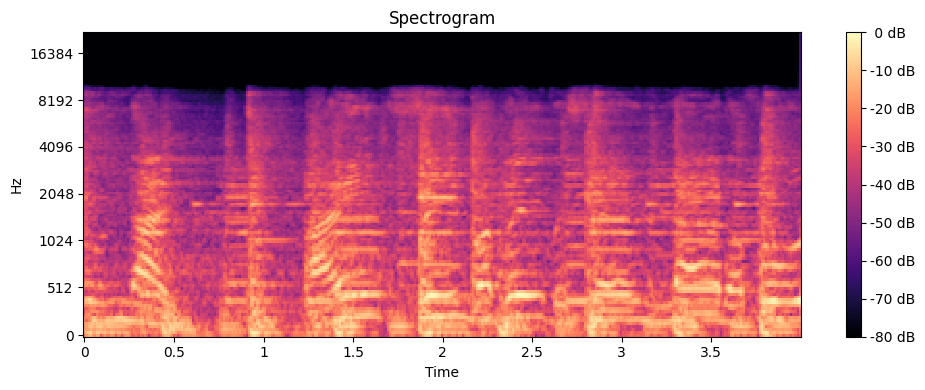

(128, 345)


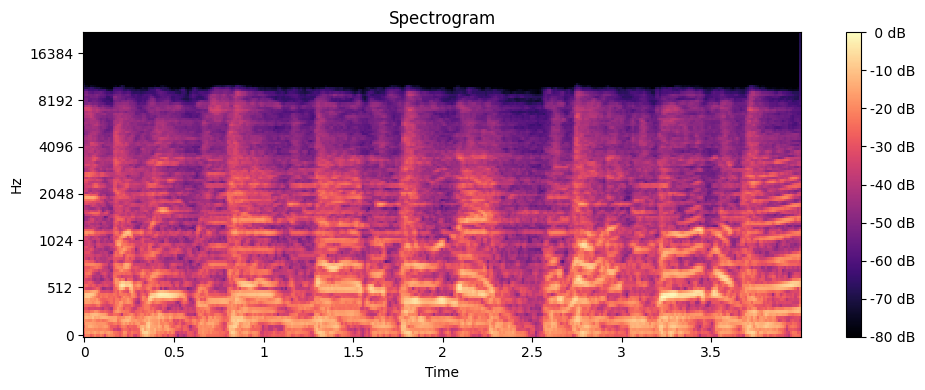

(128, 345)


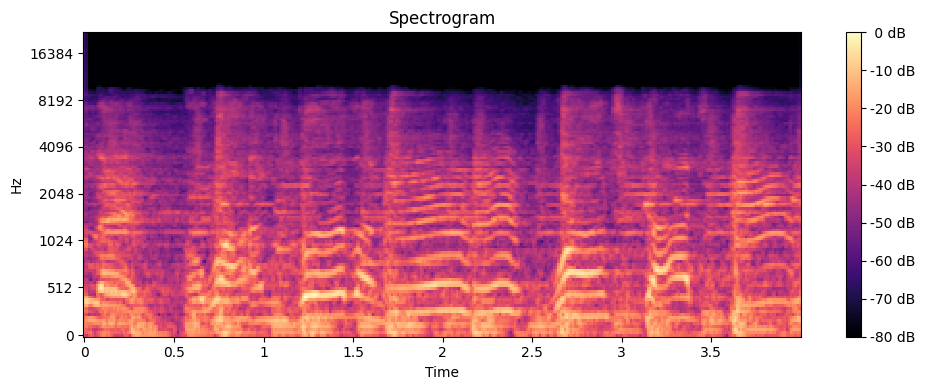

(128, 345)


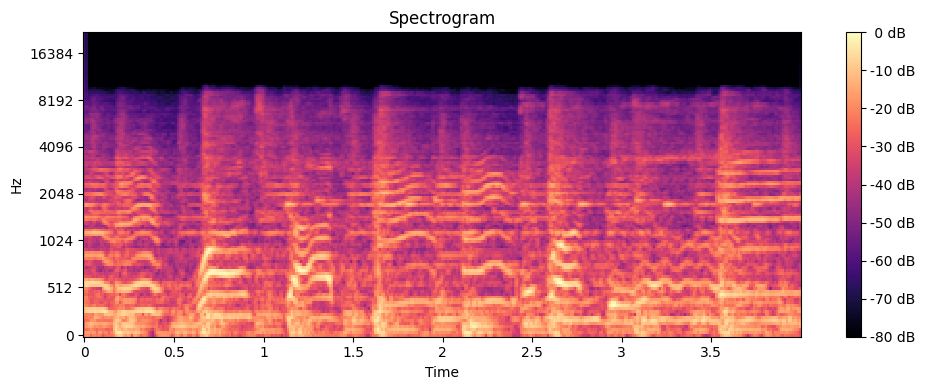

(128, 345)


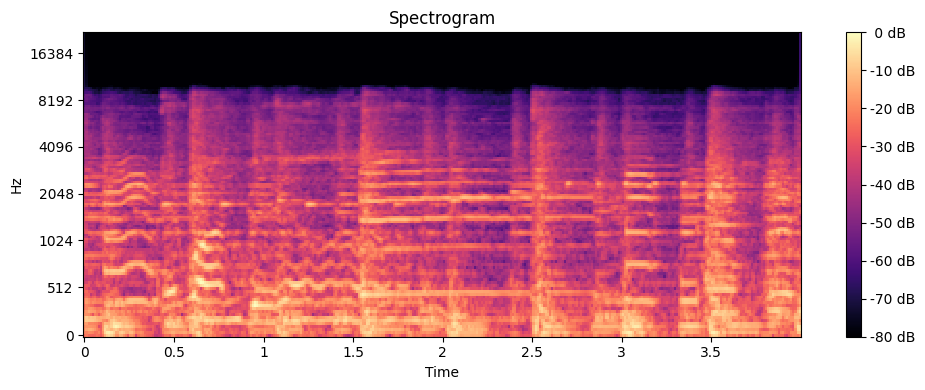

(128, 174)


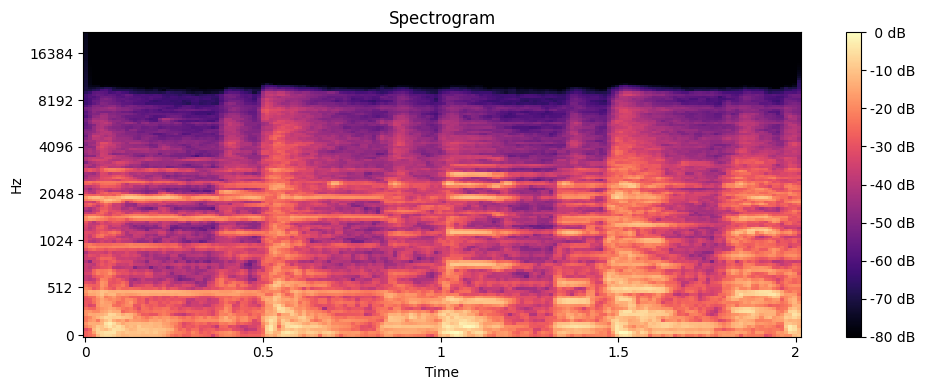

In [17]:
plot_melspectrogram_chunks(y,sr)

In [18]:
128*345

44160

In [19]:
150*150 # too less than 44160 , so the model will not get all the features. it should be close to 44160 and not more than that

22500

In [20]:
210*210  #It is pretty close to 44160

44100

In [4]:
import tensorflow as tf
tf.keras.backend.clear_session()


In [33]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_virtual_device_configuration(
                gpu,
                [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024)]
            )
    except RuntimeError as e:
        print(e)


Virtual devices cannot be modified after being initialized


In [25]:
import os
import random

# Path to your dataset
data_dir = "./genres_original"
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

# Number of files to keep per genre
files_to_keep = 80

for genre in classes:
    genre_dir = os.path.join(data_dir, genre)
    all_files = [f for f in os.listdir(genre_dir) if f.endswith('.wav')]
    
    # Randomly select files to keep
    files_to_remove = random.sample(all_files, len(all_files) - files_to_keep)
    
    # Remove files
    for file in files_to_remove:
        file_path = os.path.join(genre_dir, file)
        os.remove(file_path)
        print(f"Removed: {file_path}")


Removed: ./genres_original\blues\blues.00069.wav
Removed: ./genres_original\blues\blues.00020.wav
Removed: ./genres_original\blues\blues.00038.wav
Removed: ./genres_original\blues\blues.00077.wav
Removed: ./genres_original\blues\blues.00016.wav
Removed: ./genres_original\classical\classical.00077.wav
Removed: ./genres_original\classical\classical.00060.wav
Removed: ./genres_original\classical\classical.00095.wav
Removed: ./genres_original\classical\classical.00033.wav
Removed: ./genres_original\classical\classical.00075.wav
Removed: ./genres_original\country\country.00074.wav
Removed: ./genres_original\country\country.00082.wav
Removed: ./genres_original\country\country.00080.wav
Removed: ./genres_original\country\country.00030.wav
Removed: ./genres_original\country\country.00013.wav
Removed: ./genres_original\disco\disco.00031.wav
Removed: ./genres_original\disco\disco.00019.wav
Removed: ./genres_original\disco\disco.00082.wav
Removed: ./genres_original\disco\disco.00068.wav
Removed: 

## Data Preprocessing - Final

In [2]:
#define folder structure
data_dir = "./genres_original"
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

In [3]:
from tensorflow.image import resize
#load and preprocess audio data
def load_and_preprocess_data(data_dir,classes,target_shape=(150,150)):
    data = []
    labels = []

    for i_class,class_name in enumerate(classes):
        class_dir = os.path.join(data_dir,class_name)
        print('Processing--',class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir,filename)
                audio_data, sample_rate = librosa.load(file_path,sr=None)
                #Performing Preprocessing
                #define the duration of each chunk and overlap
                chunk_duration = 4
                overlap_duration = 2
                
                #convert duration to sample
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                
                #Calculate the number of chunks
                num_chunks = int(np.ceil((len(audio_data)-chunk_samples)/(chunk_samples-overlap_samples)))+1
                
                #iterate over each chunks
                for i in range(num_chunks):
                    #Calculate start and end indices of the chunk
                    start = i*(chunk_samples-overlap_samples)
                    end = start+chunk_samples
                    #Extract the chunk audio
                    chunk = audio_data[start:end]
            
                    #Melspectrogram part
                    mel_spectrogram = librosa.feature.melspectrogram(y=chunk,sr=sample_rate)
                    #Resize matrix based on provided target shape
                    mel_spectrogram = resize(np.expand_dims(mel_spectrogram,axis=-1),target_shape)
                    #Append data to list
                    data.append(mel_spectrogram)
                    labels.append(i_class)
    # Return
    return np.array(data),np.array(labels)
    


In [22]:
import os
import librosa

data_dir = "./genres_original"  # Path to your dataset
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

invalid_files = []

# Iterate through all files in the dataset
for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    for filename in os.listdir(class_dir):
        if filename.endswith('.wav'):
            file_path = os.path.join(class_dir, filename)
            try:
                # Attempt to load the file with librosa
                audio_data, sr = librosa.load(file_path, sr=None)
            except Exception as e:
                # Log the invalid file
                invalid_files.append((file_path, str(e)))

# Print invalid files
if invalid_files:
    print("Invalid files found:")
    for file, error in invalid_files:
        print(f"{file} - Error: {error}")
else:
    print("All files are valid!")


All files are valid!


In [4]:
data,labels = load_and_preprocess_data(data_dir,classes)

Processing-- blues
Processing-- classical
Processing-- country
Processing-- disco
Processing-- hiphop
Processing-- jazz
Processing-- metal
Processing-- pop
Processing-- reggae
Processing-- rock


In [5]:
data.shape

(11992, 150, 150, 1)

In [11]:
labels.shape

(11992,)

In [6]:
from tensorflow.keras.utils import to_categorical
labels = to_categorical(labels,num_classes = len(classes)) #converting labels to one hot encoding
labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [13]:
labels.shape

(11992, 10)

## splitting data into Training and Test set

In [14]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [7]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(data,labels,test_size=0.2,random_state=42)

In [16]:
X_train.shape

(9593, 210, 210, 1)

In [17]:
X_test.shape

(2399, 210, 210, 1)

In [18]:
Y_train.shape

(9593, 10)

In [19]:
Y_test.shape

(2399, 10)

## Building Model

In [8]:
model = tf.keras.models.Sequential()

In [36]:
X_train[0].shape

(210, 210, 1)

In [9]:
model.add(Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=X_train[0].shape))
model.add(Conv2D(filters=32,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [10]:
model.add(Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=64,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [11]:
model.add(Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=128,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [12]:
model.add(Dropout(0.3))

In [13]:
model.add(Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=256,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [14]:
model.add(Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=512,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [15]:
model.add(Dropout(0.3))

In [16]:
model.add(Flatten())

In [17]:
model.add(Dense(units=1200,activation='relu'))

In [18]:
model.add(Dropout(0.45))

In [19]:
# Output layer
model.add(Dense(units=len(classes),activation='softmax'))

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      320       
                                                                 
 conv2d_1 (Conv2D)           (None, 148, 148, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 74, 74, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                    

In [21]:
#Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),loss='categorical_crossentropy',metrics=['accuracy'])


In [22]:
#Training Model
training_history = model.fit(X_train,Y_train,epochs=30,batch_size=32,validation_data=(X_test,Y_test))

Epoch 1/30
300/300 [==============================] - 69s 175ms/step - loss: 2.0451 - accuracy: 0.2355 - val_loss: 1.6729 - val_accuracy: 0.3981
Epoch 2/30
300/300 [==============================] - 44s 147ms/step - loss: 1.5663 - accuracy: 0.4376 - val_loss: 1.4393 - val_accuracy: 0.5140
Epoch 3/30
300/300 [==============================] - 44s 148ms/step - loss: 1.2746 - accuracy: 0.5527 - val_loss: 1.1639 - val_accuracy: 0.5894
Epoch 4/30
300/300 [==============================] - 44s 148ms/step - loss: 1.0777 - accuracy: 0.6283 - val_loss: 1.0220 - val_accuracy: 0.6461
Epoch 5/30
300/300 [==============================] - 45s 149ms/step - loss: 0.9284 - accuracy: 0.6788 - val_loss: 0.7957 - val_accuracy: 0.7186
Epoch 6/30
300/300 [==============================] - 45s 149ms/step - loss: 0.7912 - accuracy: 0.7272 - val_loss: 0.7556 - val_accuracy: 0.7570
Epoch 7/30
300/300 [==============================] - 45s 149ms/step - loss: 0.6873 - accuracy: 0.7682 - val_loss: 0.7391 - val_ac

In [23]:
model.save('Trained_model.h5')

In [24]:
training_history.history

{'loss': [2.0450873374938965,
  1.566336750984192,
  1.2745894193649292,
  1.0776853561401367,
  0.9284384250640869,
  0.7912403345108032,
  0.687339186668396,
  0.5830447673797607,
  0.5180746912956238,
  0.43657153844833374,
  0.3855840265750885,
  0.3194754123687744,
  0.29501357674598694,
  0.24589109420776367,
  0.21872904896736145,
  0.18746431171894073,
  0.16758805513381958,
  0.15512306988239288,
  0.13821883499622345,
  0.13624799251556396,
  0.11513905227184296,
  0.09845583140850067,
  0.09633588790893555,
  0.09454432874917984,
  0.08443164825439453,
  0.08788590133190155,
  0.06386401504278183,
  0.06599575281143188,
  0.07724368572235107,
  0.07253614068031311],
 'accuracy': [0.23548421263694763,
  0.4376107454299927,
  0.5526946783065796,
  0.6282706260681152,
  0.6788282990455627,
  0.7271969318389893,
  0.7681642770767212,
  0.8003752827644348,
  0.8215365409851074,
  0.8511414527893066,
  0.8671948313713074,
  0.8902324438095093,
  0.8997185230255127,
  0.91618889570

In [25]:
import json
with open('training_hist.json','w') as f:
    json.dump(training_history.history,f)

In [26]:
X_train

array([[[[2.22969556e+00],
         [8.68871987e-01],
         [1.57632220e+00],
         ...,
         [8.37776718e+01],
         [9.58084564e+01],
         [1.11755157e+02]],

        [[1.08060827e+01],
         [1.37048759e+01],
         [2.69981480e+01],
         ...,
         [5.38008179e+02],
         [6.89335449e+02],
         [3.29434021e+02]],

        [[3.13597794e+01],
         [3.77207909e+01],
         [3.01863575e+01],
         ...,
         [4.75998840e+02],
         [5.51182556e+02],
         [2.07638672e+02]],

        ...,

        [[7.20977969e-03],
         [6.88606827e-03],
         [4.34417091e-03],
         ...,
         [3.70479771e-03],
         [2.20089266e-03],
         [1.08110067e-03]],

        [[5.28917369e-03],
         [6.15294883e-03],
         [4.89572249e-03],
         ...,
         [3.73181351e-03],
         [2.15169438e-03],
         [1.47654326e-03]],

        [[2.25618202e-03],
         [3.63374222e-03],
         [3.53927282e-03],
         ...,
 

In [27]:
X_test

array([[[[3.50958347e+00],
         [2.90333462e+00],
         [1.22175646e+00],
         ...,
         [3.93304863e+01],
         [2.52800007e+01],
         [7.18721342e+00]],

        [[4.89676428e+00],
         [3.82003760e+00],
         [1.37449896e+00],
         ...,
         [2.49627426e+02],
         [1.29709579e+02],
         [3.14194508e+01]],

        [[2.84801197e+00],
         [1.83391654e+00],
         [1.02818370e+00],
         ...,
         [3.91082214e+02],
         [1.77733017e+02],
         [6.52679138e+01]],

        ...,

        [[2.20663031e-03],
         [7.86553777e-04],
         [7.61314732e-05],
         ...,
         [1.05285384e-02],
         [2.01861118e-03],
         [2.01835443e-04]],

        [[1.32104813e-03],
         [5.18197019e-04],
         [6.80890953e-05],
         ...,
         [7.88619649e-03],
         [2.24975869e-03],
         [1.92175750e-04]],

        [[1.17460289e-03],
         [5.15585882e-04],
         [5.49316028e-05],
         ...,
 

In [28]:
#Reloading model variable
model = tf.keras.models.load_model('Trained_model.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      320       
                                                                 
 conv2d_1 (Conv2D)           (None, 148, 148, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 74, 74, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                    

In [39]:
#Reloading training history
import json
with open('training_hist.json','r') as json_file:
    training_history_data = json.load(json_file)

In [40]:
training_history_data

{'loss': [2.0450873374938965,
  1.566336750984192,
  1.2745894193649292,
  1.0776853561401367,
  0.9284384250640869,
  0.7912403345108032,
  0.687339186668396,
  0.5830447673797607,
  0.5180746912956238,
  0.43657153844833374,
  0.3855840265750885,
  0.3194754123687744,
  0.29501357674598694,
  0.24589109420776367,
  0.21872904896736145,
  0.18746431171894073,
  0.16758805513381958,
  0.15512306988239288,
  0.13821883499622345,
  0.13624799251556396,
  0.11513905227184296,
  0.09845583140850067,
  0.09633588790893555,
  0.09454432874917984,
  0.08443164825439453,
  0.08788590133190155,
  0.06386401504278183,
  0.06599575281143188,
  0.07724368572235107,
  0.07253614068031311],
 'accuracy': [0.23548421263694763,
  0.4376107454299927,
  0.5526946783065796,
  0.6282706260681152,
  0.6788282990455627,
  0.7271969318389893,
  0.7681642770767212,
  0.8003752827644348,
  0.8215365409851074,
  0.8511414527893066,
  0.8671948313713074,
  0.8902324438095093,
  0.8997185230255127,
  0.91618889570

In [41]:
training_history_data.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

## Model Evaluation

In [33]:
# model evaluation on training set
train_loss,train_accuracy = model.evaluate(X_train,Y_train)

300/300 [==============================] - 10s 31ms/step - loss: 0.0489 - accuracy: 0.9844


In [35]:
train_loss,train_accuracy

(0.0489109642803669, 0.9843636155128479)

In [34]:
#model evaluation on validation set
val_loss,val_accuracy = model.evaluate(X_test,Y_test)

75/75 [==============================] - 3s 31ms/step - loss: 0.5153 - accuracy: 0.8749


In [36]:
val_loss,val_accuracy

(0.5153135061264038, 0.8749479055404663)

In [42]:
training_history_data['loss']

[2.0450873374938965,
 1.566336750984192,
 1.2745894193649292,
 1.0776853561401367,
 0.9284384250640869,
 0.7912403345108032,
 0.687339186668396,
 0.5830447673797607,
 0.5180746912956238,
 0.43657153844833374,
 0.3855840265750885,
 0.3194754123687744,
 0.29501357674598694,
 0.24589109420776367,
 0.21872904896736145,
 0.18746431171894073,
 0.16758805513381958,
 0.15512306988239288,
 0.13821883499622345,
 0.13624799251556396,
 0.11513905227184296,
 0.09845583140850067,
 0.09633588790893555,
 0.09454432874917984,
 0.08443164825439453,
 0.08788590133190155,
 0.06386401504278183,
 0.06599575281143188,
 0.07724368572235107,
 0.07253614068031311]

## Accuracy and loss Visualization

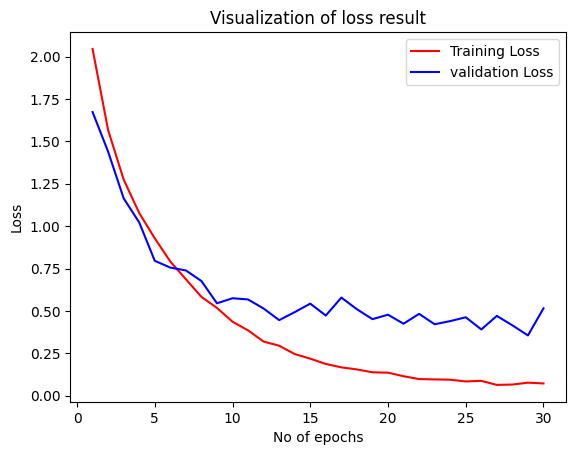

In [47]:
#Visualization of loss
epochs = [i for i in range(1,31)]
plt.plot(epochs,training_history_data['loss'],label='Training Loss',color='red')
plt.plot(epochs,training_history_data['val_loss'],label='validation Loss',color='blue')
plt.xlabel('No of epochs')
plt.ylabel('Loss')
plt.title('Visualization of loss result')
plt.legend()
plt.show()

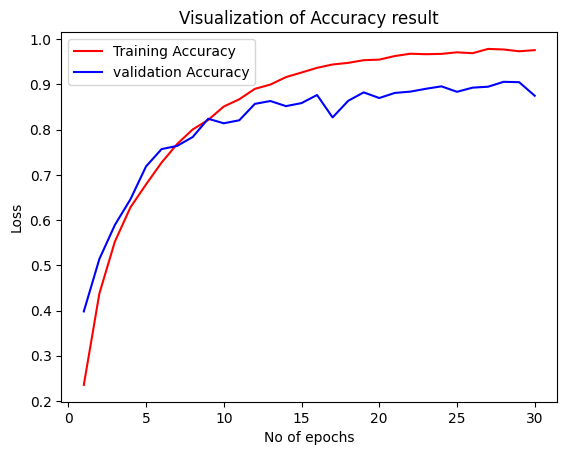

In [48]:
#Visualization of Accuracy
epochs = [i for i in range(1,31)]
plt.plot(epochs,training_history_data['accuracy'],label='Training Accuracy',color='red')
plt.plot(epochs,training_history_data['val_accuracy'],label='validation Accuracy',color='blue')
plt.xlabel('No of epochs')
plt.ylabel('Loss')
plt.title('Visualization of Accuracy result')
plt.legend()
plt.show()

## Precision, recall, Confusion Matrix - Modal Evaluation-II

In [49]:
y_pred = model.predict(X_test)
y_pred

75/75 [==============================] - 3s 43ms/step


array([[4.5804557e-04, 4.1748116e-09, 8.1035955e-07, ..., 4.6516487e-07,
        9.9942279e-01, 5.4555873e-08],
       [2.9298331e-05, 9.9198204e-01, 1.2862640e-03, ..., 4.7676862e-05,
        1.2307186e-04, 8.8457440e-05],
       [3.2127467e-05, 9.9585754e-01, 5.0957999e-05, ..., 4.1103260e-05,
        5.3593085e-06, 3.9506871e-03],
       ...,
       [1.8476861e-08, 2.3732938e-09, 5.3274618e-08, ..., 2.6503077e-03,
        3.4889306e-06, 5.2811455e-08],
       [2.4682353e-03, 9.2754857e-07, 9.9692875e-01, ..., 5.5378982e-06,
        9.3098170e-05, 3.8578958e-04],
       [4.4146535e-04, 3.6828777e-07, 7.2481250e-04, ..., 3.5200361e-07,
        6.8373185e-01, 5.3058534e-07]], dtype=float32)

In [50]:
y_pred.shape

(2399, 10)

In [52]:
predicted_categories = np.argmax(y_pred,axis=1)
predicted_categories

array([8, 1, 1, ..., 3, 2, 8], dtype=int64)

In [55]:
true_categories = np.argmax(Y_test,axis=1)
true_categories

array([8, 1, 1, ..., 3, 2, 5], dtype=int64)

In [54]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [56]:
from sklearn.metrics import confusion_matrix,classification_report
cn = confusion_matrix(true_categories,predicted_categories)
# Precision Recall Flscore
print(classification_report(true_categories,predicted_categories,target_names=classes))

              precision    recall  f1-score   support

       blues       0.74      0.96      0.84       245
   classical       0.92      0.97      0.95       238
     country       0.91      0.80      0.85       241
       disco       0.97      0.80      0.88       239
      hiphop       0.91      0.93      0.92       252
        jazz       0.86      0.90      0.88       223
       metal       0.92      0.97      0.94       250
         pop       0.77      0.95      0.85       240
      reggae       0.95      0.83      0.88       246
        rock       0.91      0.62      0.74       225

    accuracy                           0.87      2399
   macro avg       0.88      0.87      0.87      2399
weighted avg       0.88      0.87      0.87      2399



## Confusion Matrix Visualization

In [57]:
cn

array([[234,   0,   2,   0,   0,   3,   0,   1,   3,   2],
       [  0, 232,   0,   0,   0,   6,   0,   0,   0,   0],
       [ 26,   2, 194,   0,   0,  11,   0,   3,   1,   4],
       [  6,   3,   1, 191,   2,   0,   0,  28,   4,   4],
       [  0,   0,   0,   0, 235,   0,   2,  13,   1,   1],
       [  9,  10,   2,   0,   0, 201,   0,   0,   1,   0],
       [  1,   0,   0,   0,   3,   1, 242,   1,   0,   2],
       [  4,   0,   1,   1,   4,   1,   0, 228,   0,   1],
       [ 14,   0,   1,   1,   7,   8,   0,  12, 203,   0],
       [ 21,   6,  13,   4,   8,   4,  20,   9,   1, 139]], dtype=int64)

In [3]:
import seaborn as sns
plt.figure(figsize=(15,15))
sns.heatmap(cn,annot=True,annot_kws={'size':10})
plt.xlabel('Predicted Class',fontsize=10)
plt.ylabel('Actual',fontsize=10)
plt.title('Music Genre Classification Confusion Matrix',fontsize=15)
plt.show()



import matplotlib.pyplot as plt

# Your plotting code here
plt.figure(figsize=(10, 6))  # Adjust size as needed
plt.plot(...)  # Your plot

# Save as high-resolution image
plt.savefig('accuracy_loss_graph.png', dpi=300, bbox_inches='tight')
plt.show()


NameError: name 'cn' is not defined

<Figure size 1500x1500 with 0 Axes>